# 1st Kr NEXT-100 data look

## Run 15502 - 3D map

In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

## Configuration

In [2]:
import re
import glob
from collections import namedtuple

import sys
pypaths= ("/Users/hernando/work/investigacion/NEXT/software/nextana",
         "/Users/hernando/work/investigacion/NEXT/software/hipy",
         "/Users/hernando/work/investigacion/NEXT/software/IC")
for ipypath in pypaths:
       sys.path.insert(0,ipypath)

In [3]:
import numpy             as np
import pandas            as pd
import tables            as tb
from   scipy             import stats
from   scipy             import optimize

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

plt.rcParams['image.cmap'] = 'rainbow'

In [4]:
from invisible_cities.io.dst_io import load_dst, load_dsts

In [5]:
import hipy.utils        as ut
import hipy.histos       as histos
import hipy.pltext       as pltext
import hipy.profile      as prof

import nana.kr.krana    as krana
import nana.kr.kr100ana as krn100
import nana.kr.krmap    as krtool

#import nana.bclouds.bclouds      as bc
#import hipy.hfit         as hfit
from invisible_cities.io.dst_io import load_dst, load_dsts
#import invisible_cities.io.dst_io as dio

In [6]:
pltext.style()

import warnings
warnings.filterwarnings('ignore')

import time
print(' Last revision ', time.asctime())

 Last revision  Mon Jul 28 12:09:54 2025


## Import Data

In [7]:
path_data = '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/' 
path_run =  '15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc1'
#path_run  = '14862/sophronia'
#path_run = '/250107_4bar/data/kdst'
#path_run = '/250203_4bar'


from os import listdir

filenames = listdir(path_data + path_run)
filenames.sort()
print('number of files :', len(filenames))
print('fist files: ', filenames[0], filenames[-1])
filenames = [path_data + path_run + '/' + ifile for ifile in filenames]

number of files : 2419
fist files:  run_15502_0000_ldc1_trg1.v2.3.1.20250512.KrDesman.sophronia.h5 run_15502_2422_ldc1_trg1.v2.3.1.20250512.KrDesman.sophronia.h5


In [ ]:
from os import listdir
path_data = '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/' 

def getfiles(run_number, 
            version = "v2.3.1/20250512",
            city = "sophronia",
            trigger = 'trigger1',
            ldc = 'ldc1'):
    path_run =  f'{run_number}/hdf5/prod/{version}/sophronia/trigger1/{ldc}/'
    filenames = listdir(path_data + path_run)
    filenames.sort()
    print('number of files :', len(filenames))
    print('fist files: ', filenames[0], filenames[-1])
    filenames = [path_data + path_run + '/' + ifile for ifile in filenames]
    return filenames

In [101]:
files = [getfiles(15502, ldc = 'ldc'+str(i+1))[0] for i in range(7)]

number of files : 1
fist files:  ldc1.h5 ldc1.h5
number of files : 1
fist files:  ldc2.h5 ldc2.h5
number of files : 1
fist files:  ldc3.h5 ldc3.h5
number of files : 1
fist files:  ldc4.h5 ldc4.h5
number of files : 1
fist files:  ldc5.h5 ldc5.h5
number of files : 1
fist files:  ldc6.h5 ldc6.h5
number of files : 1
fist files:  ldc7.h5 ldc7.h5


In [102]:
files

['/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc1/ldc1.h5',
 '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc2/ldc2.h5',
 '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc3/ldc3.h5',
 '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc4/ldc4.h5',
 '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc5/ldc5.h5',
 '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc6/ldc6.h5',
 '/Users/hernando/work/investigacion/NEXT/data/NEXT100/data/15502/hdf5/prod/v2.3.1/20250512/sophronia/trigger1/ldc7/ldc7.h5']

In [103]:
kdst = load_dsts(files, "DST", "Events")
#kdst = load_dst(filenames[0], "DST", "Events")

In [104]:
kdst.columns

Index(['event', 'time', 's1_peak', 's2_peak', 'nS1', 'nS2', 'S1w', 'S1h',
       'S1e', 'S1t', 'S2w', 'S2h', 'S2e', 'S2q', 'S2t', 'qmax', 'Nsipm', 'DT',
       'Z', 'Zrms', 'X', 'Y', 'R', 'Phi', 'Xrms', 'Yrms'],
      dtype='object')

## Prepare Data

In [105]:
kdst = krn100.df_extend(kdst)
#kdst = kdst.rename(columns = {'S2e' : 'energy', 'X' : 'x', 'Y' : 'y', 'Z' : 'dt', 'Zrms': 'dtrms',
#                              'DT' : 'dtime', 'R' : 'r'})

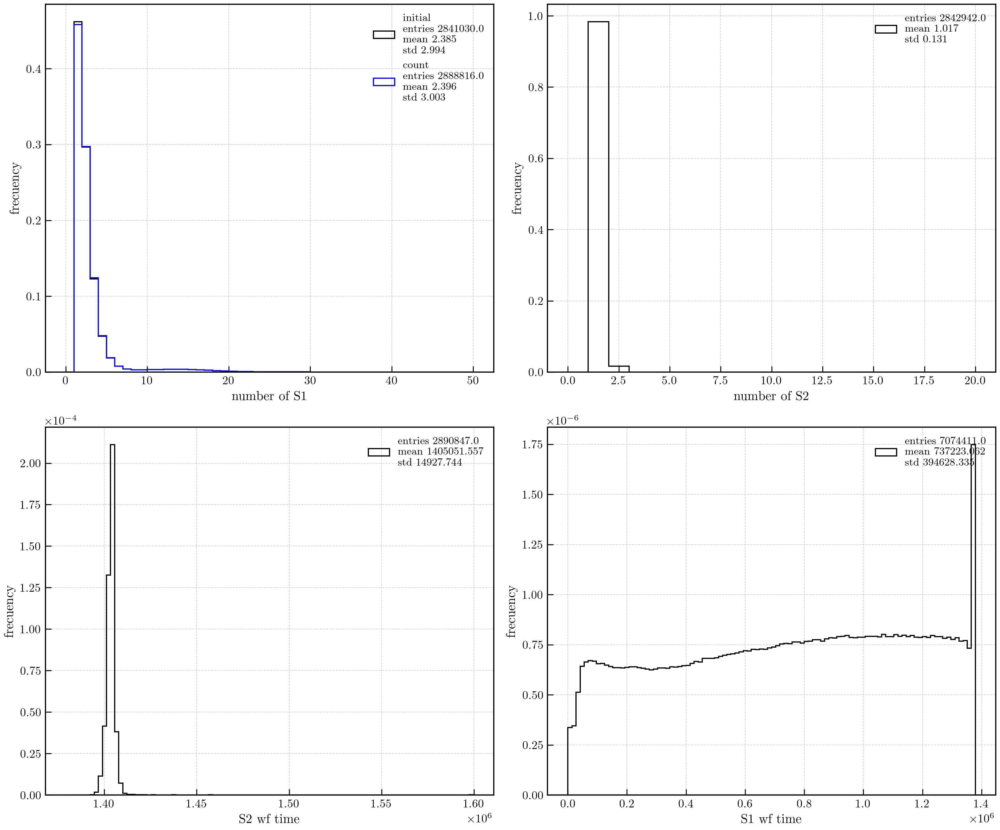

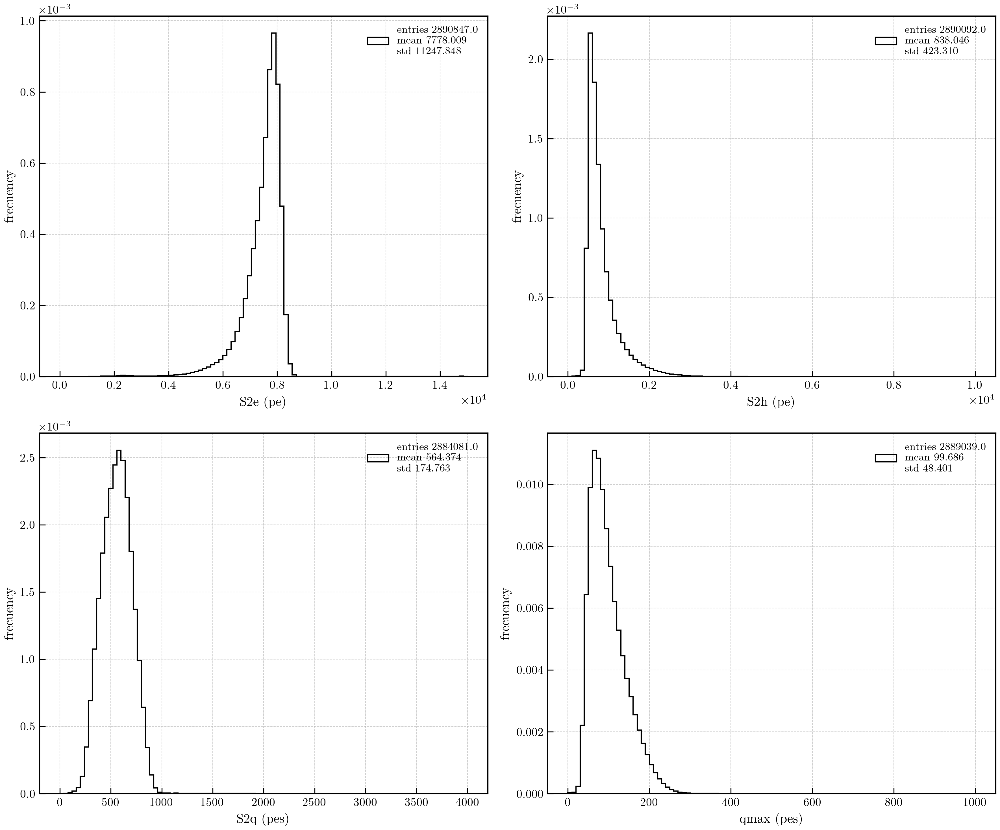

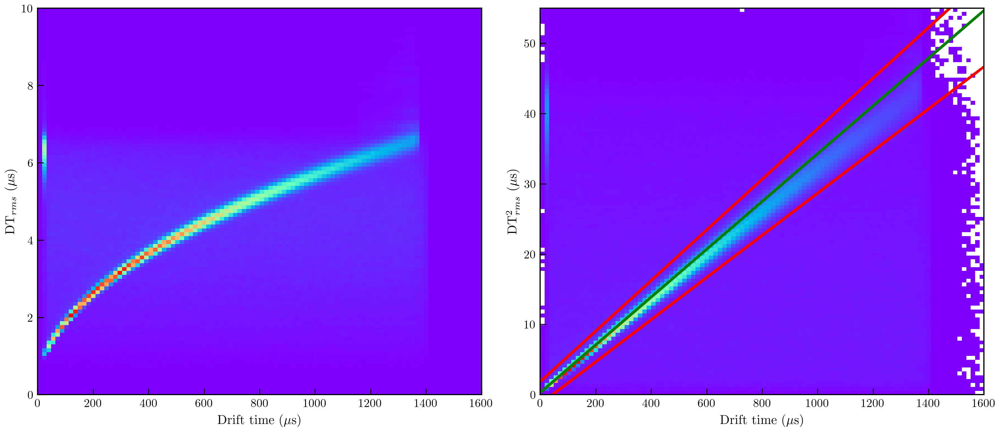

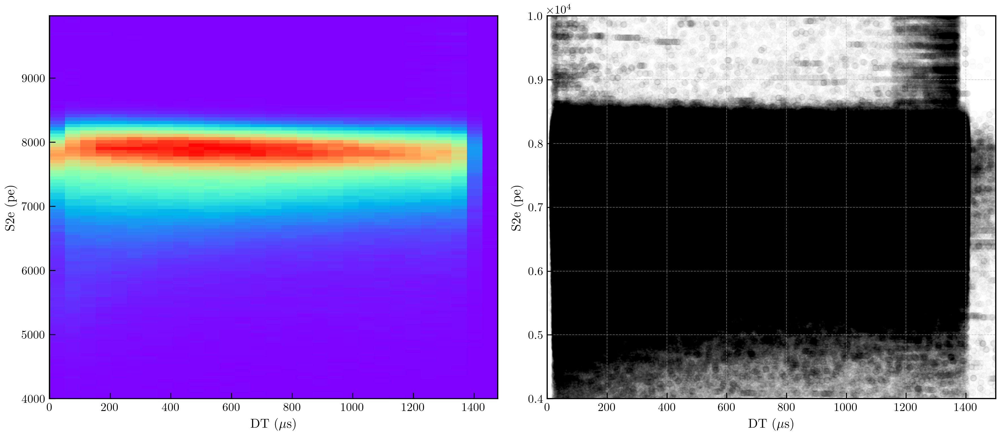

In [106]:
krn100.monitor_S1S2(kdst)
krn100.monitor_S2(kdst)
krn100.monitor_S2s_dtime(kdst)
krn100.monitor_lifetime(kdst)

## Standard selection

In [107]:
kdst_, effs    = krn100.kdst_select(kdst)

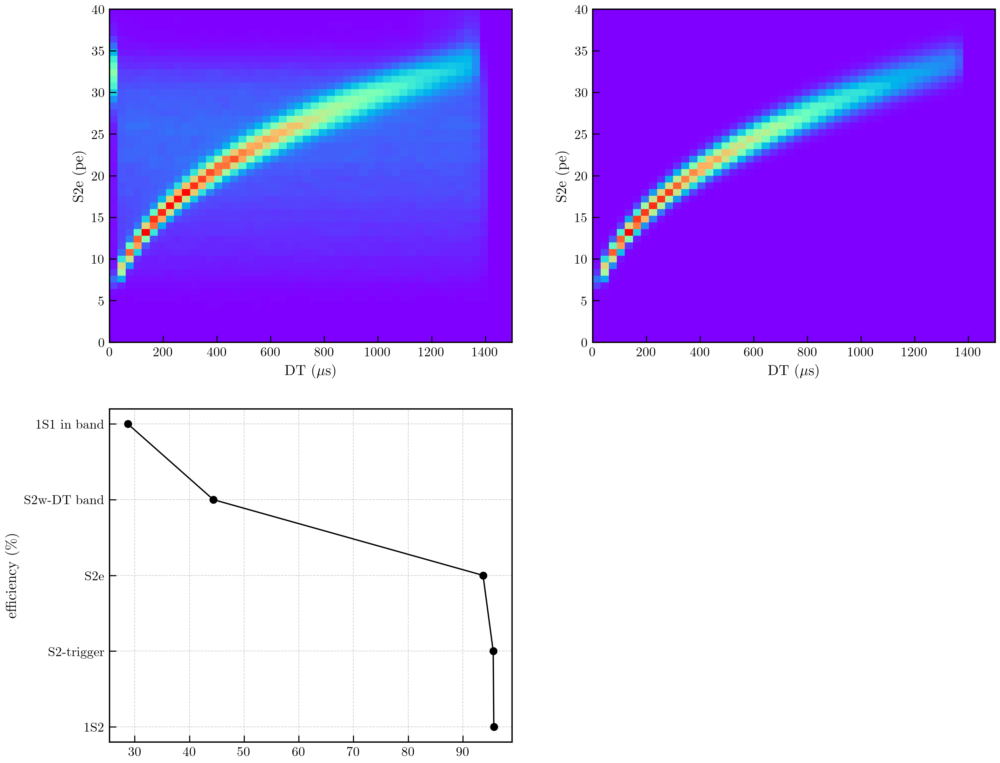

In [108]:
cv = pltext.canvas(4, 2)
cv(3);
names, vals = [x[0] for x in effs], [100.*x[1] for x in effs]
plt.plot(vals, names, marker = "o", color = 'black', lw =1); plt.ylabel("efficiency (\%)")
cv(1); plt.hist2d(kdst.DT, kdst.S2w, 50, ((0, 1500), (0, 40))); 
plt.xlabel(r'DT ($\mu$s)'), plt.ylabel('S2e (pe)');
cv(2); plt.hist2d(kdst_.DT, kdst_.S2w, 50, ((0, 1500), (0, 40))); 
plt.xlabel(r'DT ($\mu$s)'), plt.ylabel('S2e (pe)');

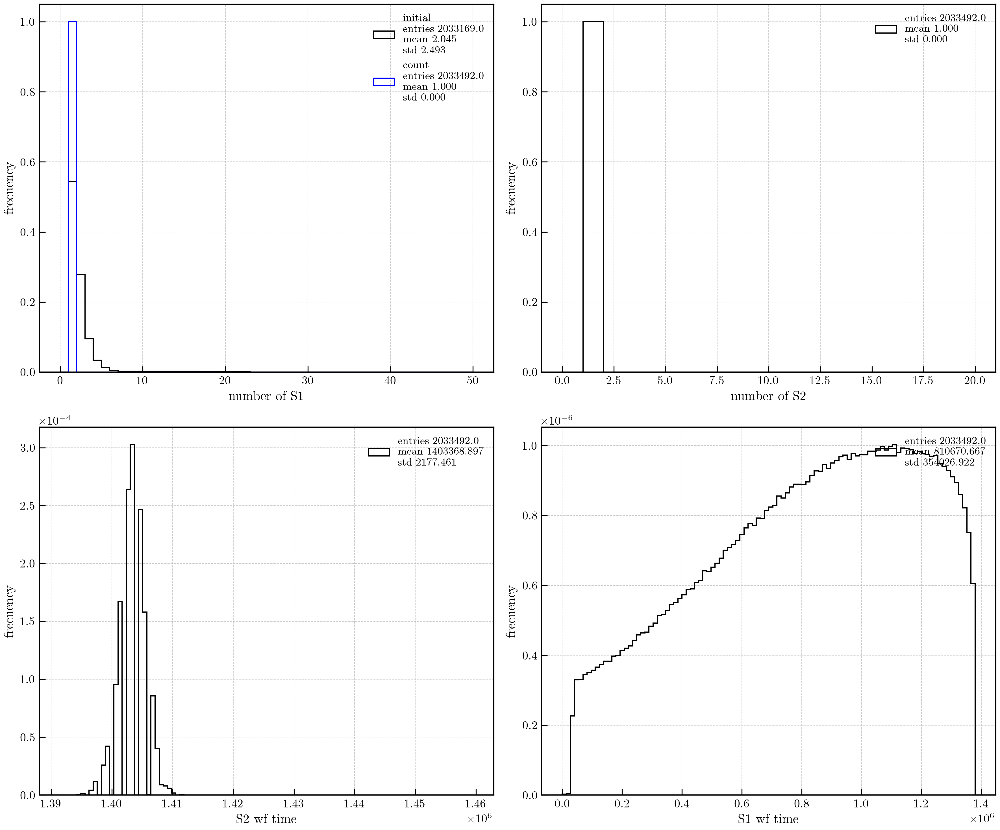

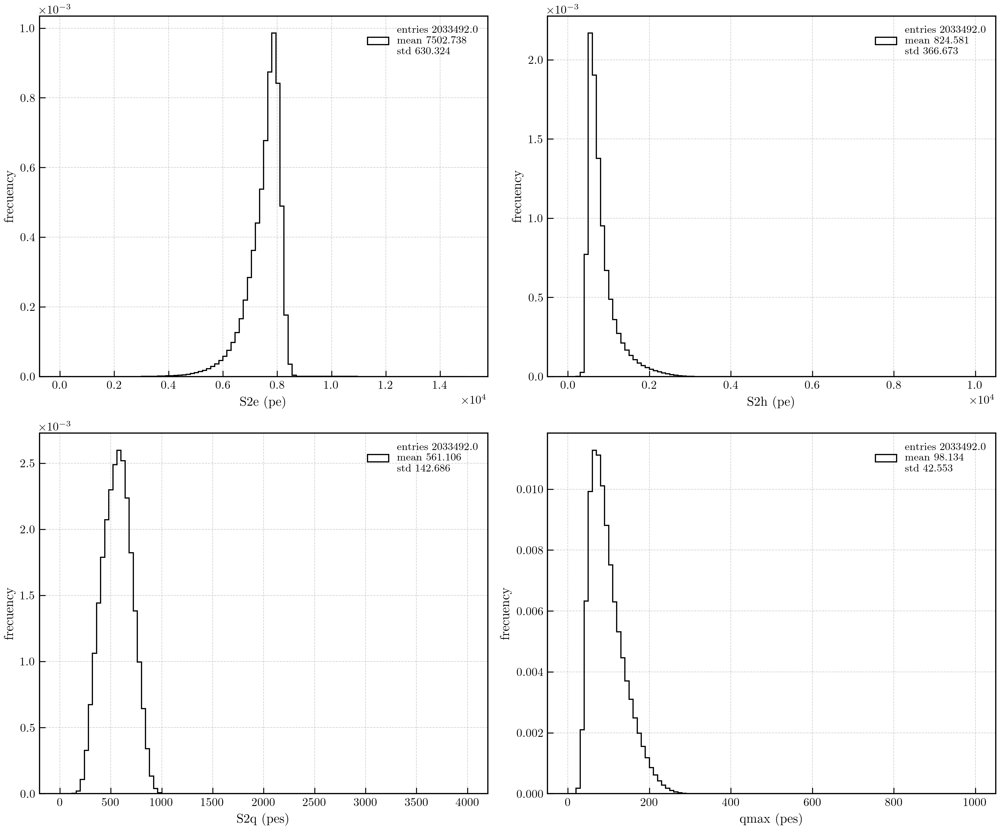

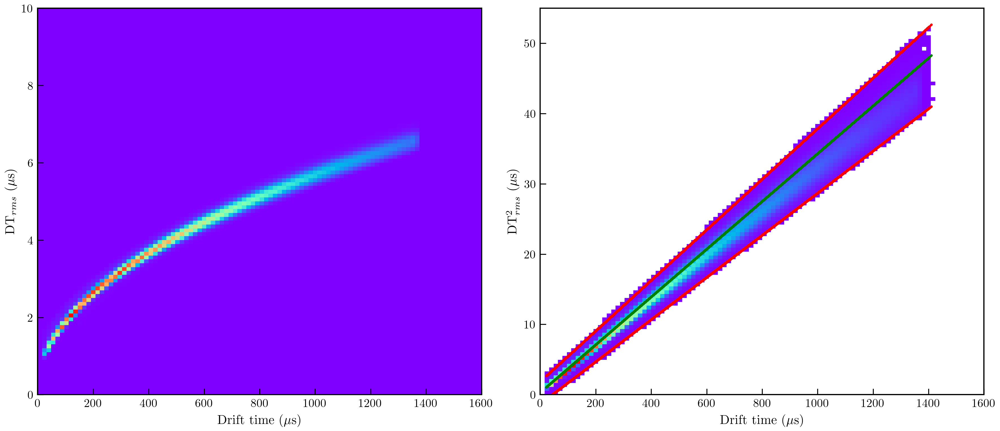

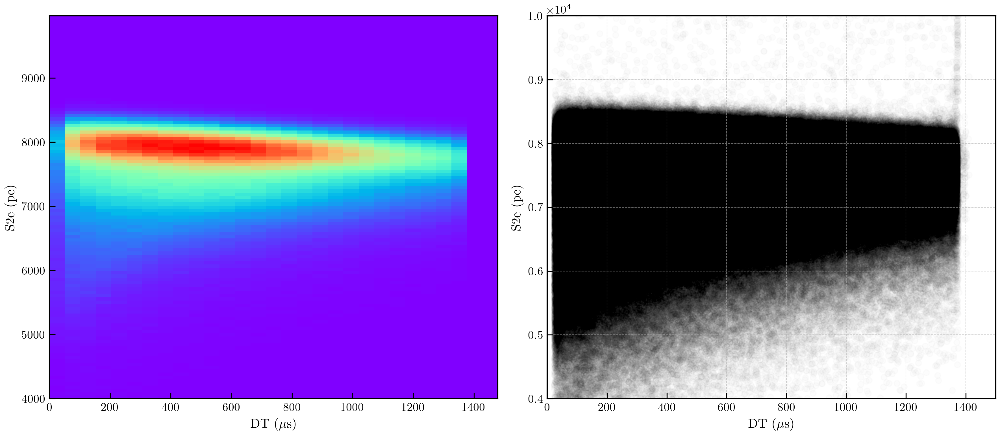

In [109]:
krn100.monitor_S1S2(kdst_)
krn100.monitor_S2(kdst_)
krn100.monitor_S2s_dtime(kdst_)
krn100.monitor_lifetime(kdst_)

## Fidutal selection

In [110]:
df = kdst_
sels = {}
sels['R']        = ut.in_range(df.R  , (0., 500.))
sels['DT']       = ut.in_range(df.DT , (0., 2000.))
sels['S2e']      = ut.in_range(df.S2e, (0e3, 9e3))
sels['fidutial'] = (sels['R']) & (sels['DT']) & (sels['S2e'])

## KrMap

In [111]:
counts_min = 40
pitch      = 15.00
xmin       = -489.825
xbins      = np.arange(xmin, -xmin + pitch, pitch)
bins       = (xbins, xbins) 
print('number of bins ', len(xbins), ', range : ', xbins[0], ', ', xbins[-1])

number of bins  67 , range :  -489.825 ,  500.175


In [112]:
#df     = kdst_
sel    = sels['fidutial']
coors  = df[sel].X, df[sel].Y, df[sel].DT
energy = df[sel].S2e
dtime  = df[sel].DT

In [124]:
1000/15

66.66666666666667

In [114]:
k3d, res  = prof.profile(coors, energy, bins = (100, 100, 10)) 

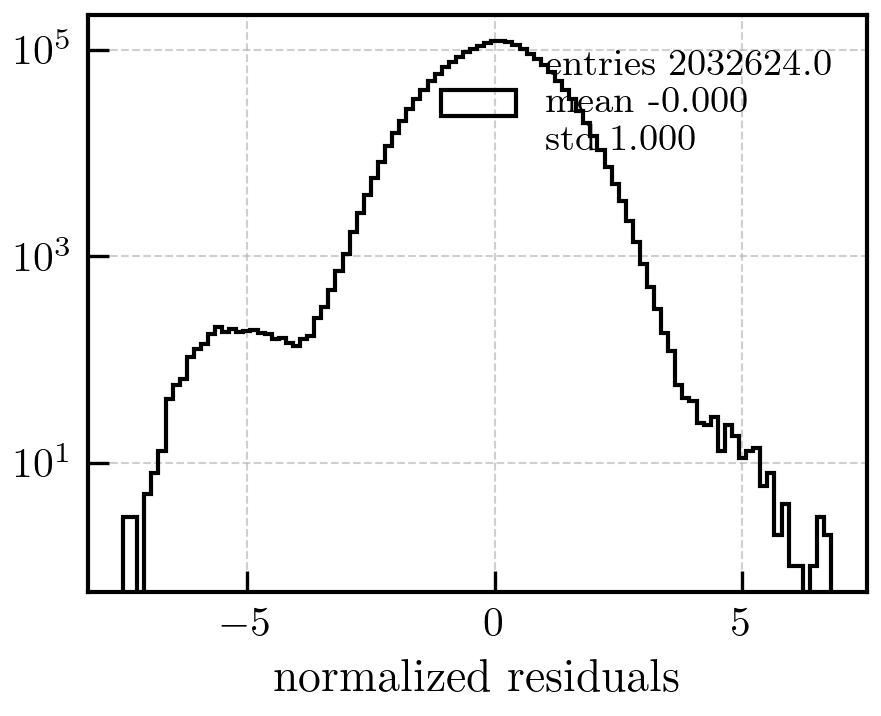

In [115]:
pltext.hist(res, 100);
plt.yscale('log');
plt.xlabel("normalized residuals");

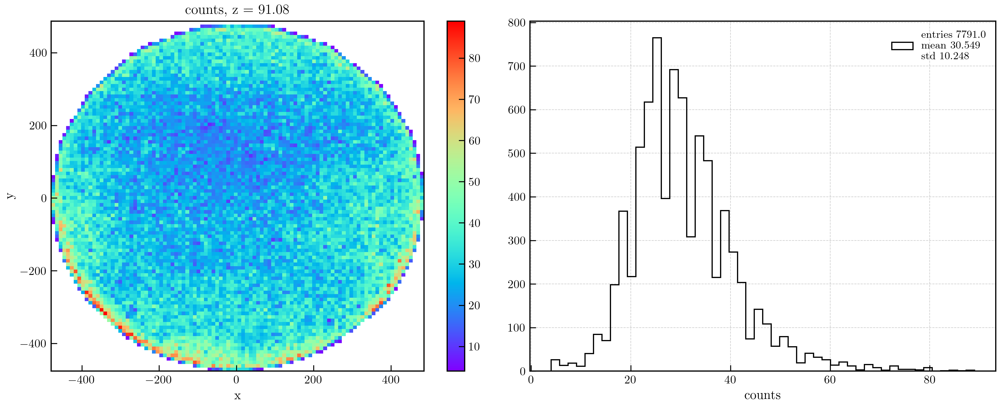

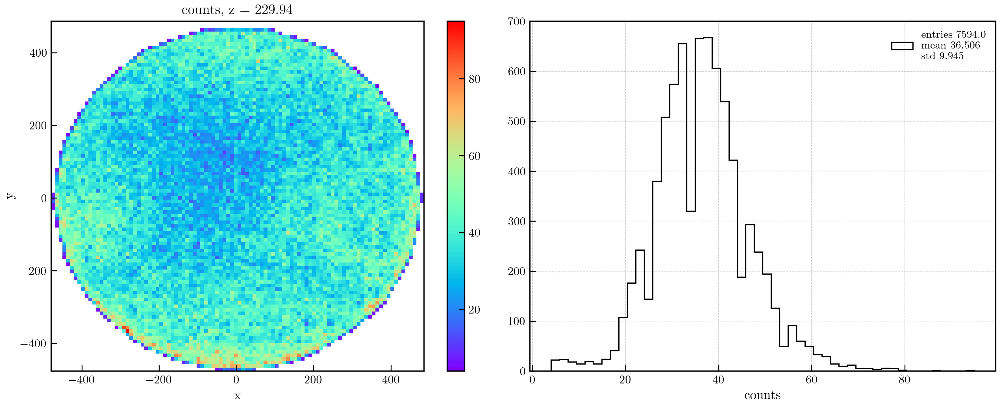

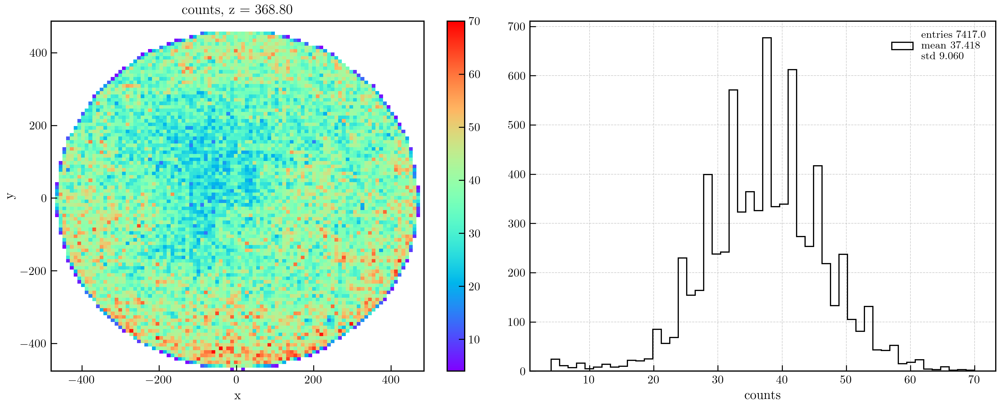

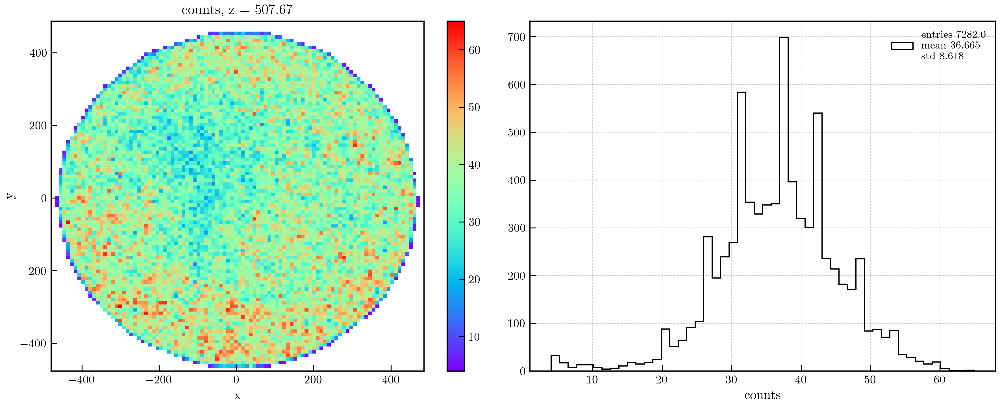

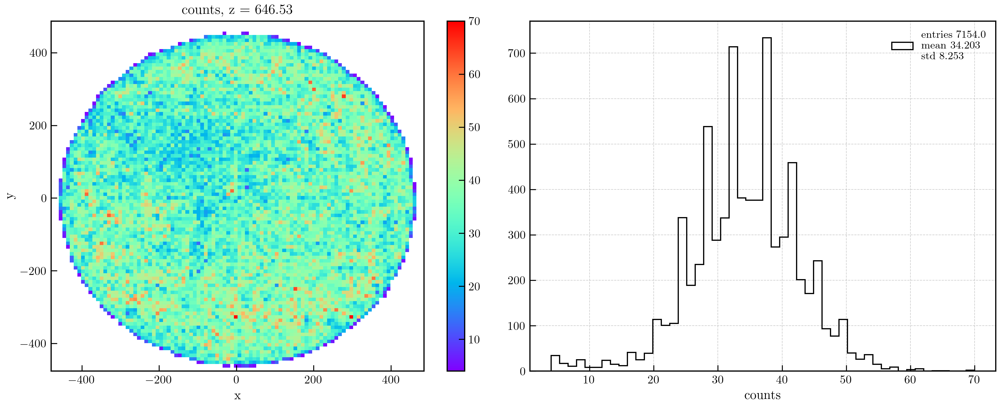

...

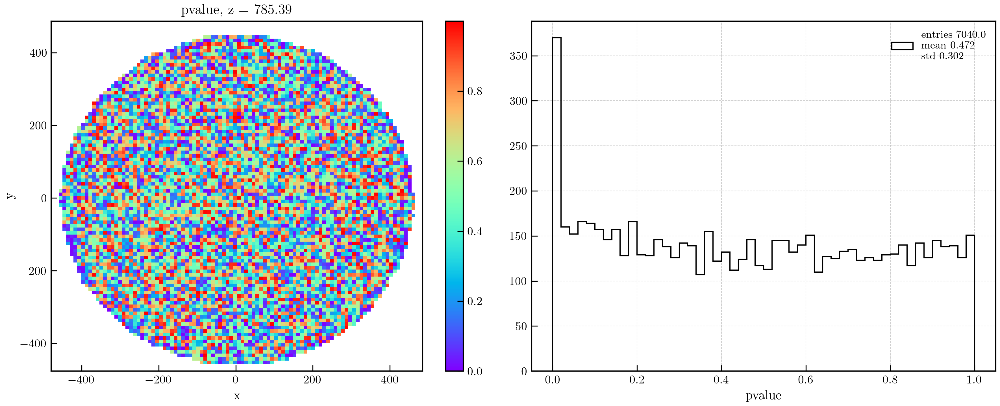

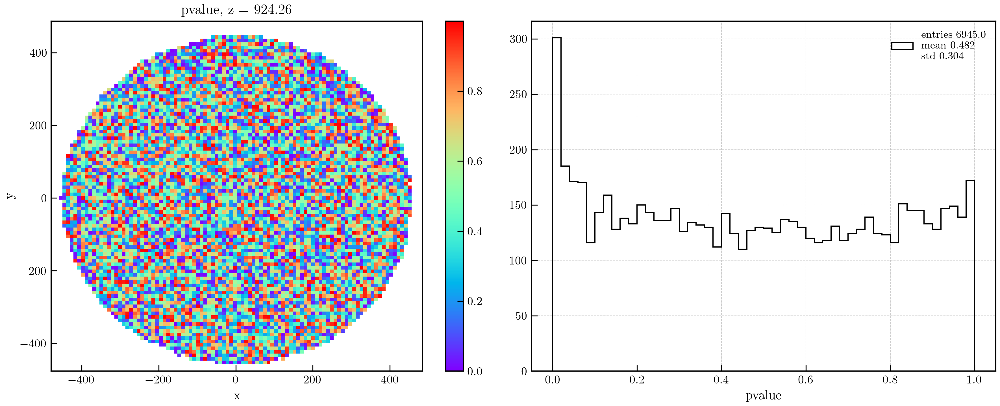

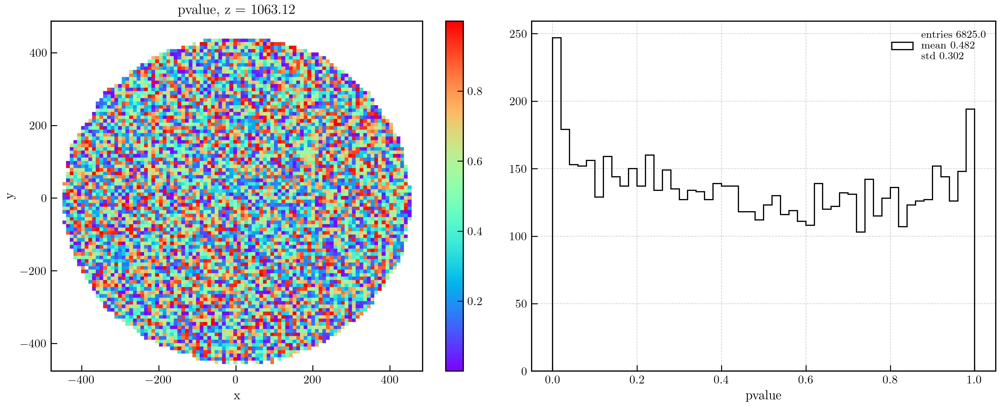

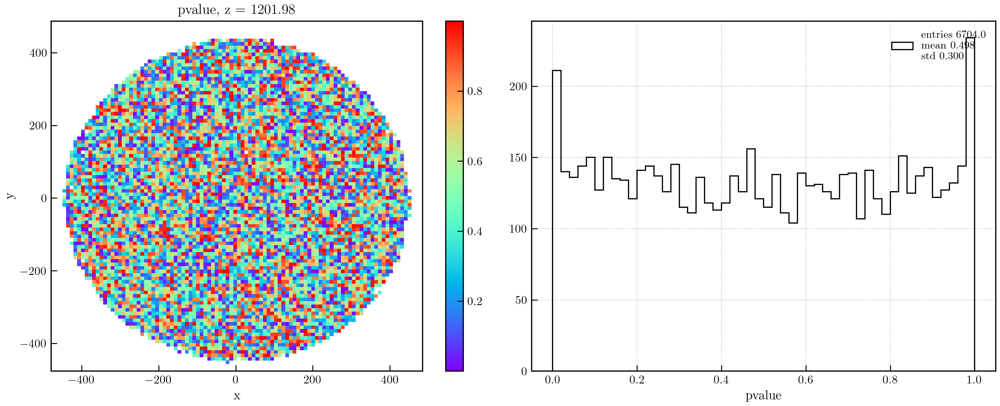

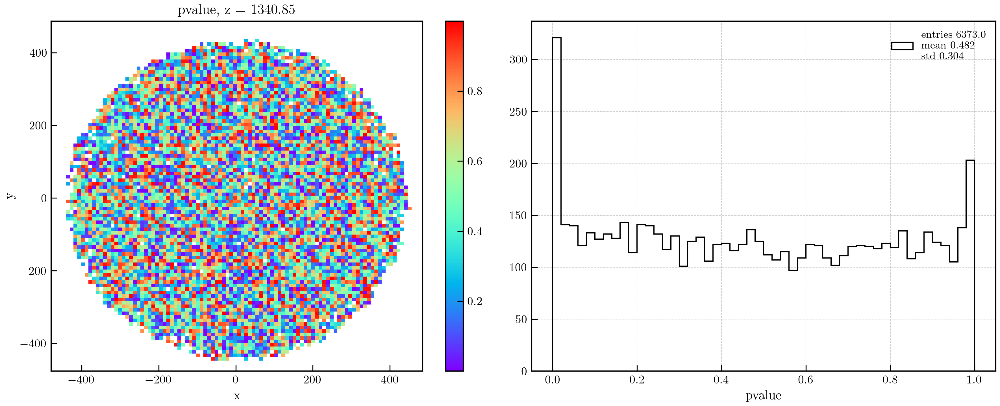

In [116]:
prof.plot_profile(k3d, stats = ('counts', 'mean', 'std', 'chi2', 'pvalue'));

In [117]:
correne = prof.profile_scale(coors, energy, k3d, 41.5)

[1.39382741e+05 4.15245671e+01 8.03522549e-01]
 Resolution   4.56 % FWHM


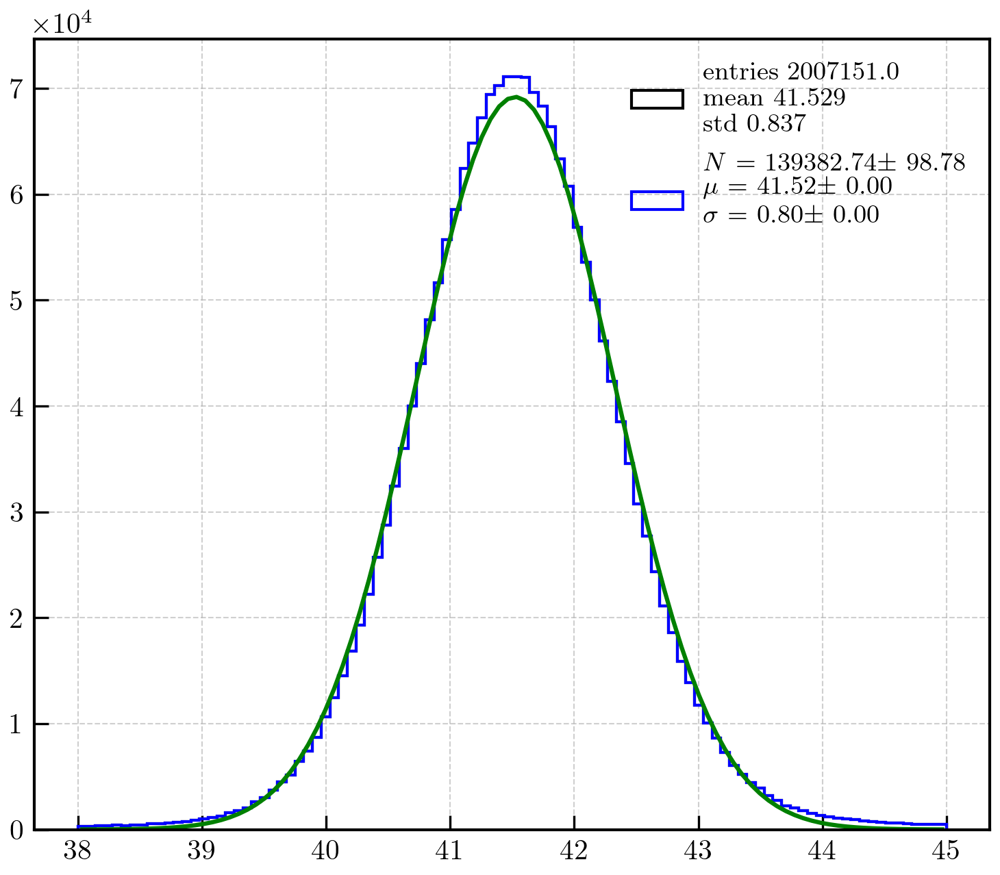

In [118]:
xsel = ~np.isnan(correne)
nbins, erange = 100, (38., 45)
pltext.canvas(1, 1);
pltext.hist(correne[xsel], nbins, erange);
cc = pltext.hfit(correne[xsel], nbins, range = erange, fun = 'gaus');
pars = cc[3]
print(pars)
resolution = 235.5 * pars[2]/pars[1]
print(' Resolution {:6.2f} % FWHM'.format(resolution))

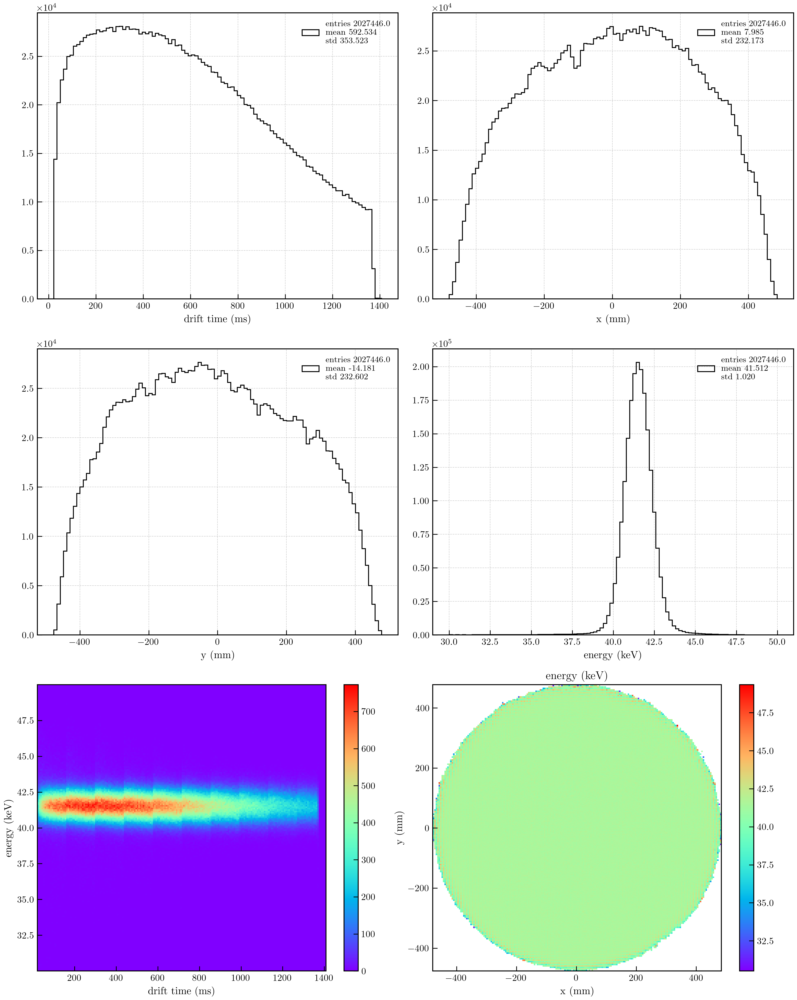

In [120]:
xsel = np.logical_and(~np.isnan(correne), ut.in_range(correne, (30, 50)))
df = {'x': coors[0][xsel], 'y' : coors[1][xsel], 'dtime': dtime[xsel], 'energy' : correne[xsel]}
df = pd.DataFrame(df)
krana.plot_data(df.x, df.y, df.dtime, df.energy, bins = 200)

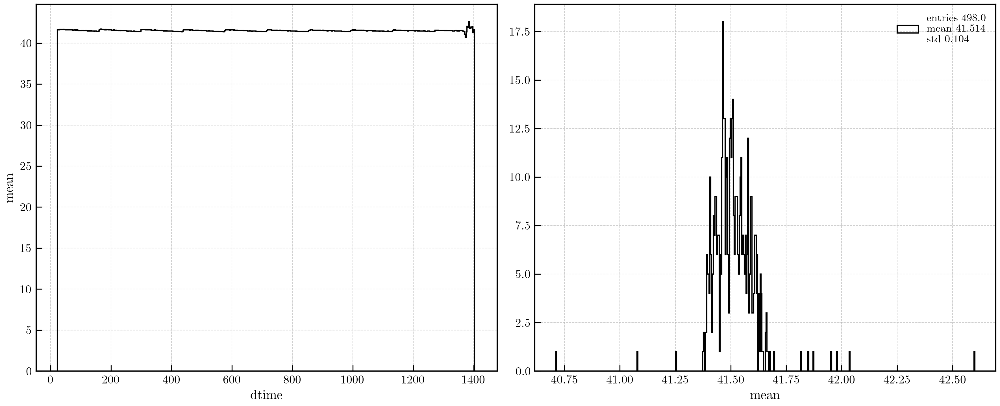

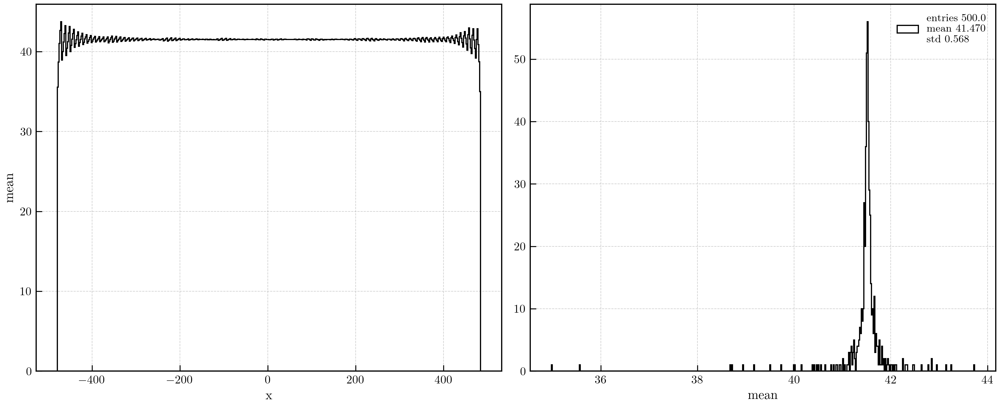

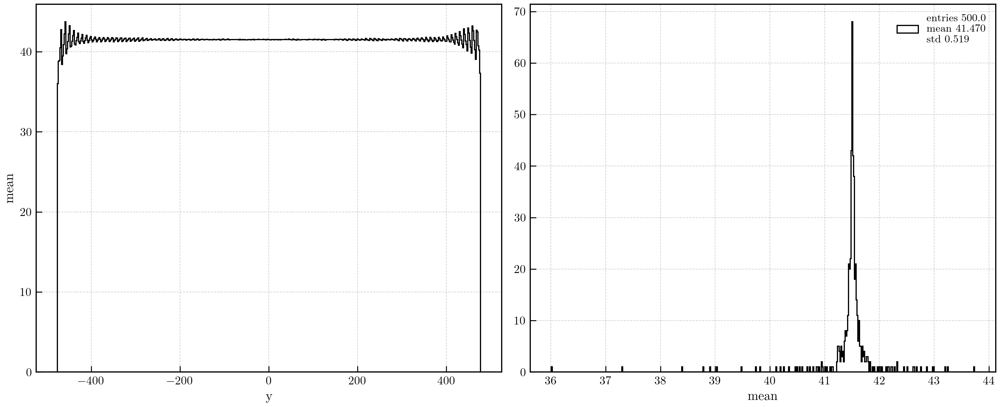

In [123]:
krtool.plot_xydt_energy_profiles(df, nbins = 500)

 Resolution   4.26 % FWHM
4.256905831531135


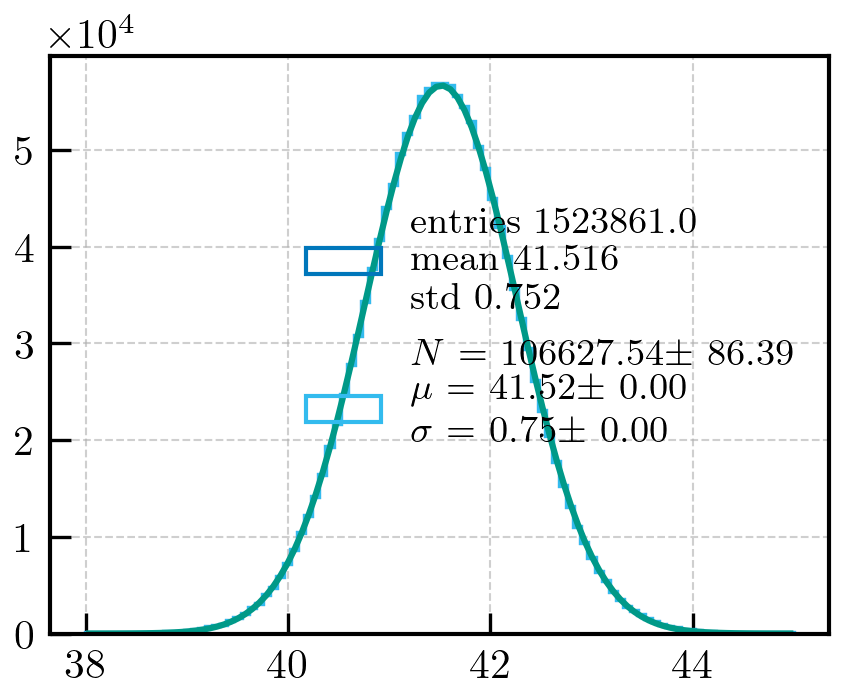

In [ ]:
df.r = np.sqrt(df.x**2 + df.y**2)
xsel = df.r < 400.
nbins, erange = 100, (38., 45)
fwhm = krn100.energy_resolution(df.energy[xsel], plot = True);

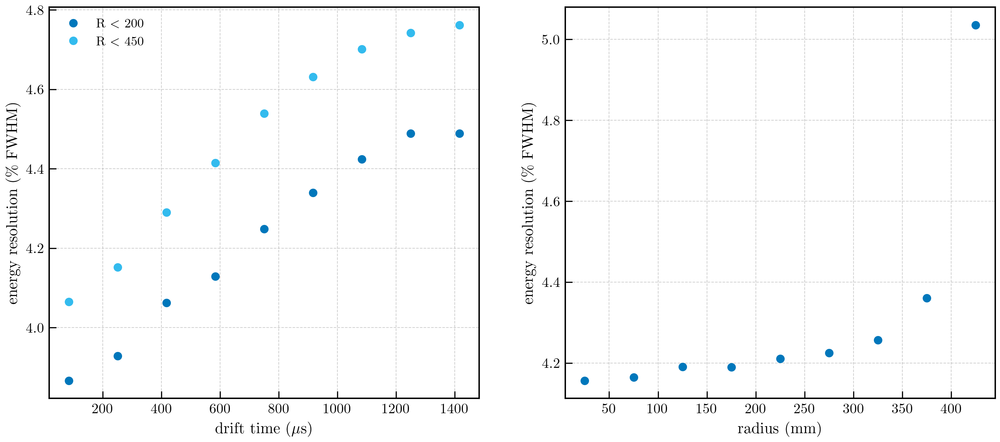

In [155]:
krn100.plot_eres_in_regions(df)